In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pwd

/content


In [3]:
import os

os.chdir('./drive/MyDrive/Image Segmentation/')
os.getcwd()

'/content/drive/MyDrive/Image Segmentation'

In [4]:
os.listdir()

['dataset', 'Lab1.ipynb']

In [5]:
os.listdir('./dataset')

['Tumor.png',
 'Fire.jpg',
 'Gesture.jpg',
 'Writing.png',
 'Defect.jpg',
 'Dust.jpg',
 'Retina.jpg',
 'Mask.jpg',
 'Car.jpg',
 'Code.jpg',
 'Chest.jpg',
 'Iris.jpg',
 'Leaf.jpg',
 'Face.jpg',
 'Brain.jpg',
 'Bone.jpg',
 'Activities.jpeg',
 'Crack.jpg',
 'Hand.jpg',
 'Lung.png',
 'Cross.jpg',
 'QR.jpg',
 'Shelf.jpg',
 'Cloths.jpg',
 'Barcode.png',
 'Sign.jpg',
 'Melanoma.jpg',
 'Emotion.jpg']

## Libraries

In [6]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
from skimage.segmentation import mark_boundaries
from scipy import ndimage as ndi
import pandas as pd
import json
import os
import timeit
import random

## Ultility function

In [7]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt
    import matplotlib.gridspec as gridspec

    gs = gridspec.GridSpec(nRows, nCols)
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,20))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

In [8]:
import os
import pandas as pd

def get_subfiles(dir):
    "Get a list of immediate subfiles"
    return next(os.walk(dir))[2]

In [9]:
def ResizeImage(IM, DesiredWidth, DesiredHeight):
    from skimage.transform import rescale, resize

    OrigWidth = float(IM.shape[1])
    OrigHeight = float(IM.shape[0])
    Width = DesiredWidth
    Height = DesiredHeight

    if((Width == 0) & (Height == 0)):
        return IM

    if(Width == 0):
        Width = int((OrigWidth * Height)/OrigHeight)

    if(Height == 0):
        Height = int((OrigHeight * Width)/OrigWidth)

    dim = (Width, Height)
    resizedIM = cv2.resize(IM, dim, interpolation = cv2.INTER_NEAREST)
    return resizedIM

In [10]:
def otsu(gray):
  pixel_number = gray.shape[0] * gray.shape[1]
  mean_weigth = 1.0/pixel_number
  his, bins = np.histogram(gray, np.array(range(0, 256)))
  final_thresh = -1
  final_value = -1

  WBackground = []
  WForeground = []
  Values = []

  for t in bins[1:-1]: # This goes from 1 to 254 uint8 range (Pretty sure wont be those values)
      Wb = np.sum(his[:t]) * mean_weigth
      Wf = np.sum(his[t:]) * mean_weigth

      mub = np.mean(his[:t])
      muf = np.mean(his[t:])

      value = Wb * Wf * (mub - muf) ** 2
      # print("Wb", Wb, "Wf", Wf)
      # print("t", t, "value", value)
      WBackground.append(Wb)
      WForeground.append(Wf)
      Values.append(value)

      if value > final_value:
          final_thresh = t
          final_value = value

  final_img = gray.copy()
  print(final_thresh)
  final_img[gray > final_thresh] = 255
  final_img[gray < final_thresh] = 0
  return final_img, final_thresh, [WBackground, WForeground, Values]

In [11]:
def two_peaks_threshold(image, smooth_hist=True, sigma=5):
    from scipy.ndimage import gaussian_filter

    hist = np.histogram(image, bins=range(256))[0].astype(np.float64)
    plt.plot(hist)
    plt.show()

    if smooth_hist:
        hist = gaussian_filter(hist, sigma=sigma)
        plt.plot(hist)
        plt.show()

    f_peak = np.argmax(hist)

    # finding second peak
    s_peak = np.argmax((np.arange(len(hist)) - f_peak) ** 2 * hist)

    thr = np.argmin(hist[min(f_peak, s_peak): max(f_peak, s_peak)])
    thr += min(f_peak, s_peak)

    final_img = image.copy()
    print(thr)
    final_img[image > thr] = 255
    final_img[image < thr] = 0

    return final_img, thr, hist

In [12]:
from scipy import ndimage as ndi
def FillHoles(Mask):
  Result = ndi.binary_fill_holes(Mask)
  return Result

In [13]:
def SelectLargestRegion(Mask):
  import pandas as pd
  from skimage.measure import label, regionprops

  mask = Mask.copy()
  mask_output = mask * 0
  label_img = label(mask)
  regions = regionprops(label_img)
  max_area = 0
  ilabel = 0
  for props in regions:
    area = props.area
    if(area > max_area):
      max_area = area
      ilabel = props.label

  mask_output = mask_output + (label_img == ilabel).astype(int)
  return mask_output

In [14]:
def morphology(Mask, Size):
  from skimage.morphology import erosion, dilation, opening, closing, white_tophat
  from skimage.morphology import disk
  selem = disk(abs(Size))
  if(Size > 0):
      result = dilation(Mask, selem)
  else:
      result = erosion(Mask, selem)
  return result

In [15]:
def SegmentColorImageByMask(IM, Mask):
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

In [55]:
def gammaCorrection(src, gamma):
    invGamma = 1 / gamma

    table = [((i / 255) ** invGamma) * 255 for i in range(256)]
    table = np.array(table, np.uint8)

    return cv2.LUT(src, table)

In [16]:
len(os.listdir('./dataset'))

28

# 1.
- Xử lý segment bàn tay sử dụng global và local thresholding

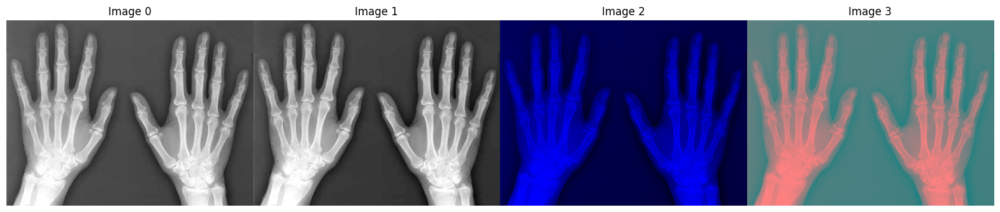

In [17]:
current_path = os.getcwd()
file_name = 'dataset/Hand.jpg'

image_orig = cv2.imread(os.path.join(current_path, file_name))
image_gray = cv2.cvtColor(image_orig, cv2.COLOR_BGR2GRAY)
image_hsv = cv2.cvtColor(image_orig, cv2.COLOR_BGR2HSV)
image_ycbcr = cv2.cvtColor(image_orig, cv2.COLOR_BGR2YCR_CB)
ShowImage([image_orig, image_gray, image_hsv, image_ycbcr], 1, 4)

## 1.1 Segment bằng Global Thresholding

- Preprocessing bức ảnh bằng cách sử dụng kĩ thuật cân bằng Histogram CLAHE

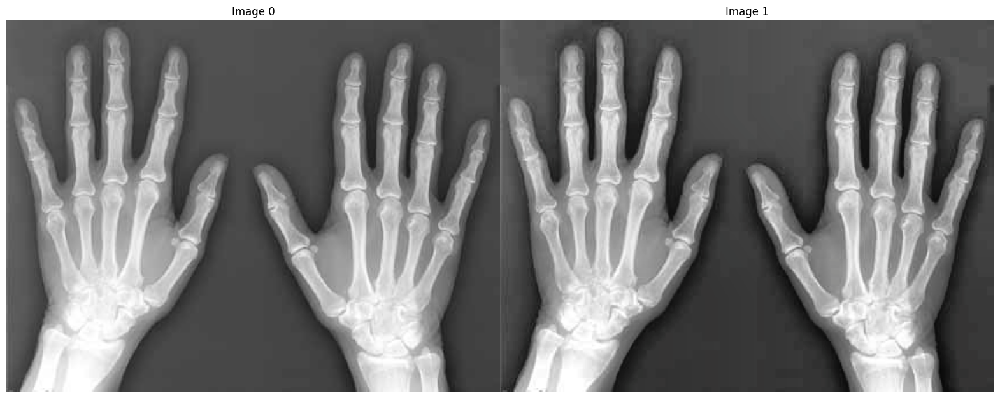

In [50]:
# converting to LAB color space
lab = cv2.cvtColor(image_orig, cv2.COLOR_RGB2LAB)
l_channel, a, b = cv2.split(lab)

# Applying CLAHE to L-channel
clahe = cv2.createCLAHE(clipLimit=1.9, tileGridSize=(2,2))
cl = clahe.apply(l_channel)

# merge the CLAHE enhanced L-channel with the a and b channel
limg = cv2.merge((cl,a,b))
# Converting image from LAB Color model to RGB color spcae
enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
ShowImage([image_orig, enhanced_img], 1, 2)

gray_img_enhanced = cv2.cvtColor(enhanced_img, cv2.COLOR_RGB2GRAY)

- Segment các phần da, xương bàn tay và background trong bức ảnh

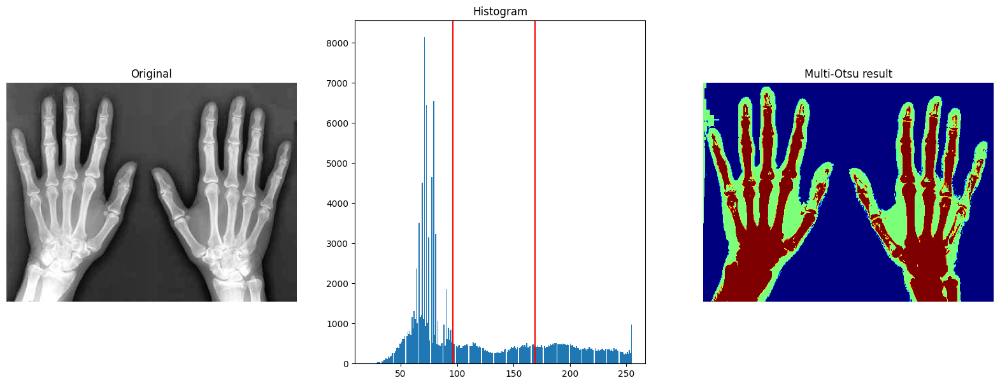

In [51]:
from skimage.filters import threshold_multiotsu
# Applying multi-Otsu threshold for the default value, generating
# three classes.
thresholds = threshold_multiotsu(gray_img_enhanced)
# Using the threshold values, we generate the three regions.
regions = np.digitize(gray_img_enhanced, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 7))
# Plotting the original image.
ax[0].imshow(gray_img_enhanced, cmap='gray')
ax[0].set_title('Original')
ax[0].axis('off')
# Plotting the histogram and the two thresholds obtained from
# multi-Otsu.
ax[1].hist(image_gray.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')
# Plotting the Multi Otsu result.
ax[2].imshow(regions, cmap='jet')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')
plt.subplots_adjust()
plt.show()

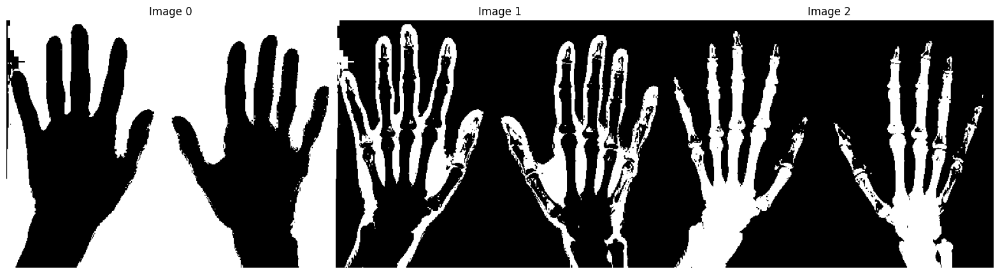

In [52]:
Segments = []
for idx in list(np.unique(regions)):
  mask = regions == idx
  Segments.append(mask)

ShowImage(Segments, 1, len(Segments))

## 1.2 Segment bằng Local Thresholding
### 1.2.1 Phân tách xương bàn tay sử dụng local threshold
- Sử dụng Gamma Correction làm nổi bật phần xương

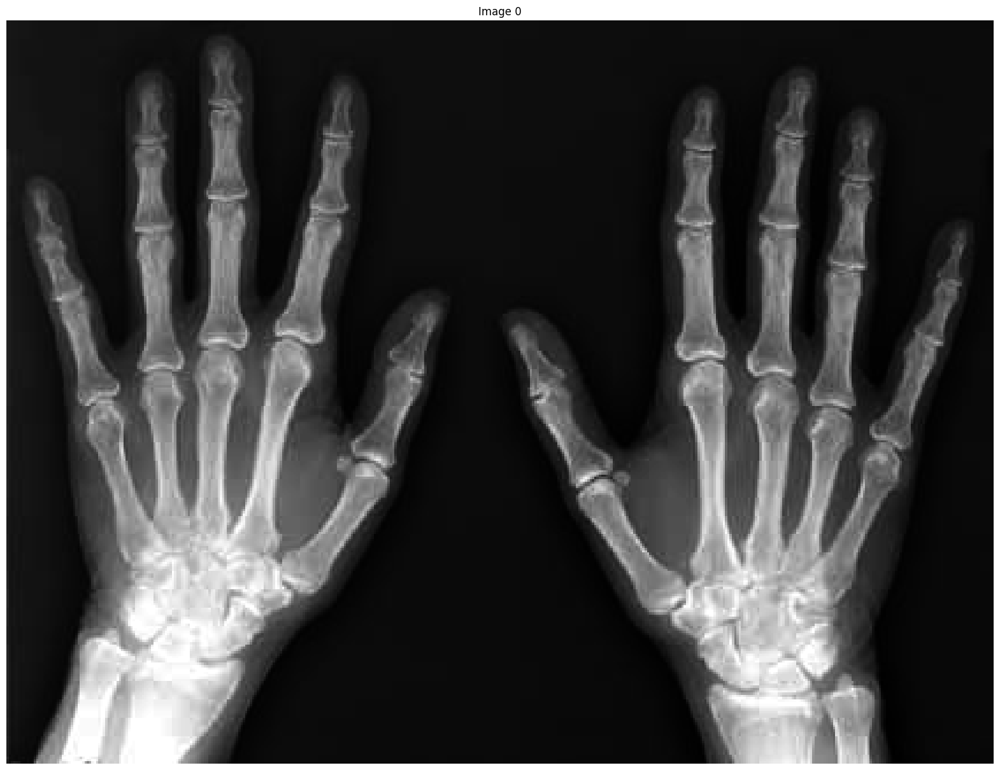

In [54]:
gamma_image = gammaCorrection(image_gray, 0.4)
ShowImage([gamma_image], 1, 1)

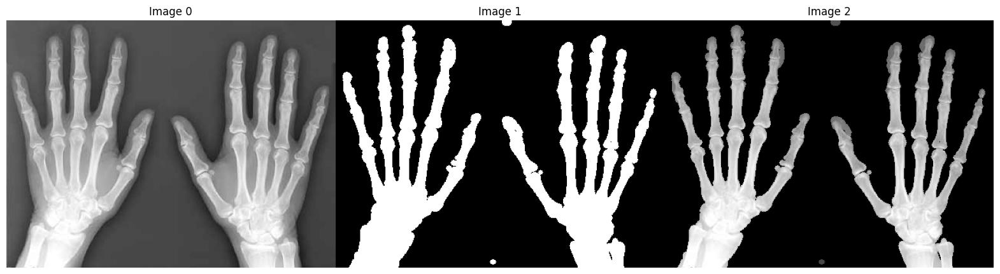

In [56]:
from skimage.filters import threshold_local
from skimage.morphology import disk, opening, closing

binary_image1 = gamma_image > threshold_local(gamma_image, 141, 'mean')

selem = disk(3)
binary_image1 = opening(binary_image1, selem)

binary_niblack_color = SegmentColorImageByMask(image_orig, binary_image1)

ShowImage([image_orig, binary_image1, binary_niblack_color], 1, 3)

### 1.2.2 Phân tách bàn tay




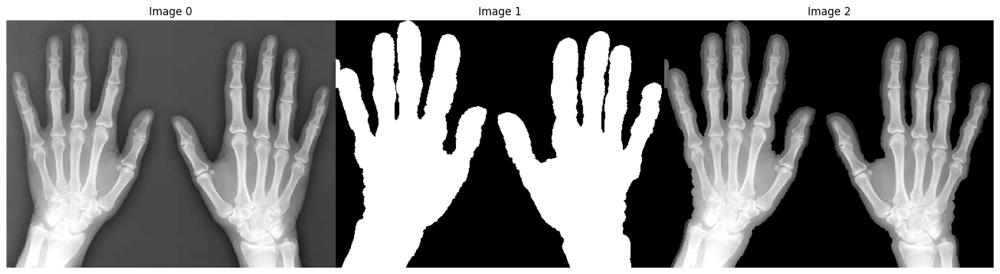

In [60]:
from skimage.filters import threshold_local
from skimage.morphology import disk, opening, closing

binary_image1 = image_gray > threshold_local(image_gray, 333, 'gaussian')
binary_image1 = morphology(binary_image1, 5)

hand_segment = SegmentColorImageByMask(image_orig, binary_image1)

ShowImage([image_orig, binary_image1, hand_segment], 1, 3)

### 1.3.1 Phân tách da từ hình ảnh segment bàn tay và hình ảnh segment xương

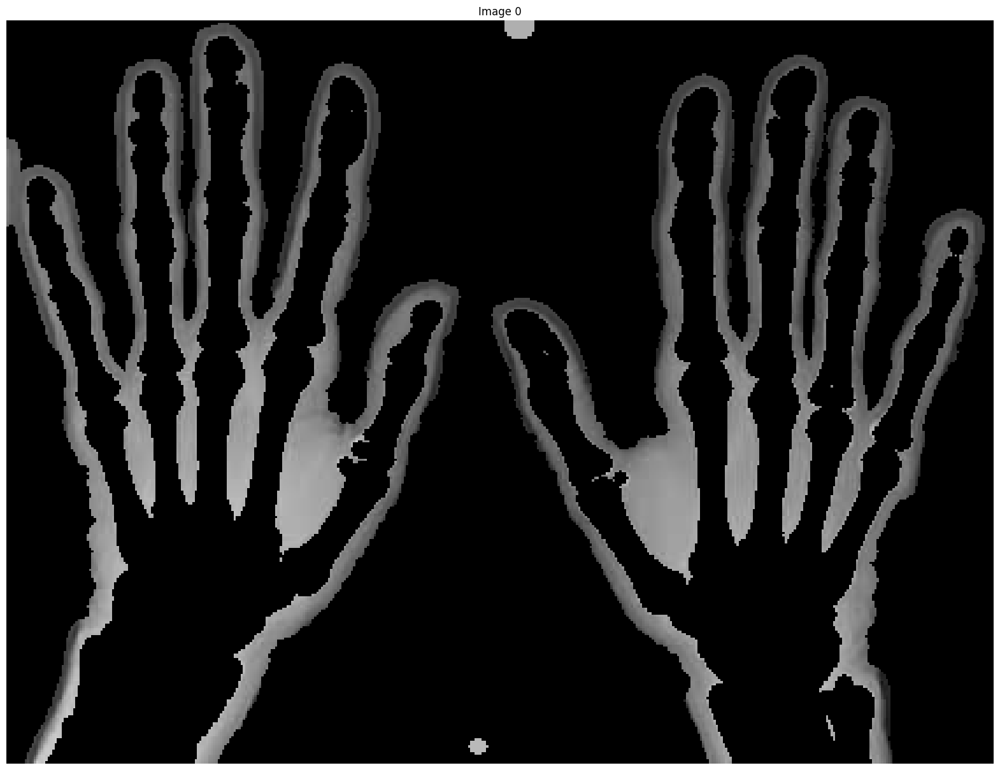

In [61]:
ShowImage([hand_segment - binary_niblack_color], 1, 1)

- Phần background, xương và da sau khi segment

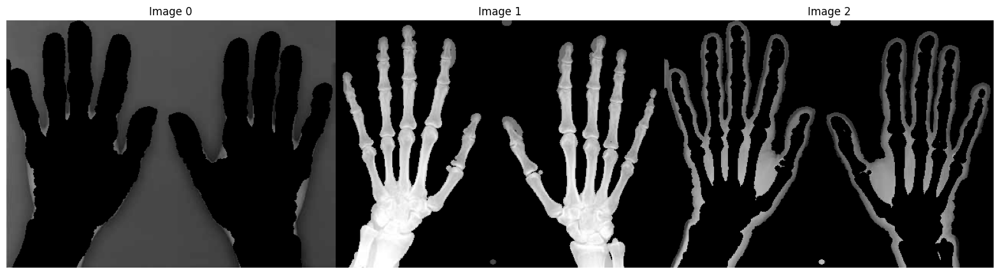

In [63]:
ShowImage([image_orig - hand_segment, binary_niblack_color, hand_segment - binary_niblack_color], 1, 3)

----------
# 2. Chọn 2 bức ảnh và thực hiện segment bằng local và global thresholding

## 2.1 Bức ảnh về chữ viết tay

Trong hình này đối tượng cần segment là chữ viết tay xuất hiện trong hình ảnh

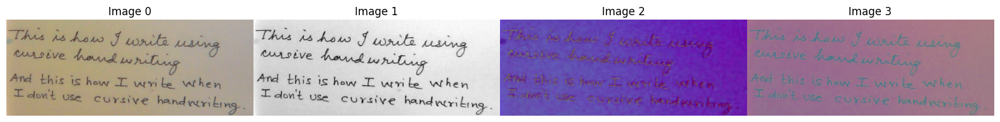

In [64]:
current_path = os.getcwd()
file_name = 'dataset/Writing.png'

image_orig = cv2.imread(os.path.join(current_path, file_name))
image_gray = cv2.cvtColor(image_orig, cv2.COLOR_BGR2GRAY)
image_hsv = cv2.cvtColor(image_orig, cv2.COLOR_BGR2HSV)
image_ycbcr = cv2.cvtColor(image_orig, cv2.COLOR_BGR2YCR_CB)
ShowImage([image_orig, image_gray, image_hsv, image_ycbcr], 1, 4)

- Sử dụng Multi-Otsu (global thresholding)

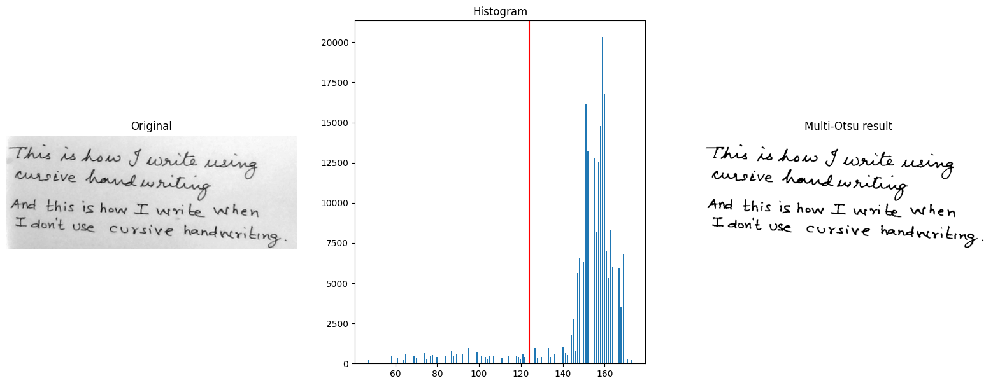

In [65]:
from skimage.filters import threshold_multiotsu
# Applying multi-Otsu threshold for the default value, generating
# three classes.
thresholds = threshold_multiotsu(image_gray, classes=2)
# Using the threshold values, we generate the three regions.
regions = np.digitize(image_gray, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 7))
# Plotting the original image.
ax[0].imshow(image_gray, cmap='gray')
ax[0].set_title('Original')
ax[0].axis('off')
# Plotting the histogram and the two thresholds obtained from
# multi-Otsu.
ax[1].hist(image_gray.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')
# Plotting the Multi Otsu result.
ax[2].imshow(regions, cmap='gray')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')
plt.subplots_adjust()
plt.show()

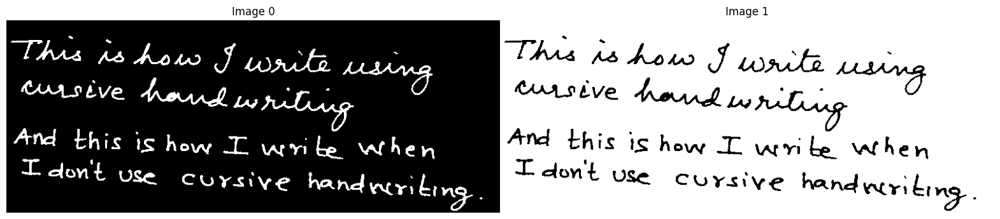

In [66]:
Segments = []
for idx in list(np.unique(regions)):
  mask = regions == idx
  Segments.append(mask)

ShowImage(Segments, 1, len(Segments))

- Sử dụng local thresholding

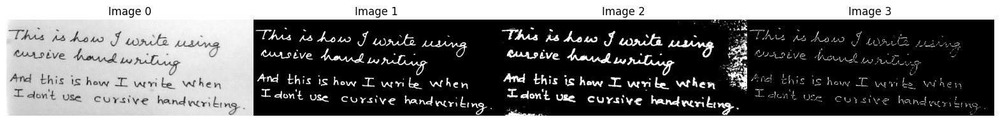

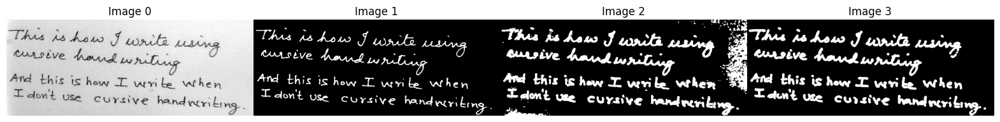

In [67]:
from skimage.filters import (threshold_otsu, threshold_niblack, threshold_sauvola)
image = image_gray
binary_global = image < threshold_otsu(image)

thresh_niblack = threshold_niblack(image, window_size=111)
thresh_sauvola = threshold_sauvola(image, window_size=5)

binary_niblack = image < thresh_niblack
binary_sauvola = image < thresh_sauvola

ShowImage([image, binary_global, binary_niblack, binary_sauvola], 1, 4)

binary_niblack = morphology(binary_niblack, 1)
binary_sauvola = morphology(binary_sauvola, 3)

ShowImage([image, binary_global, binary_niblack, binary_sauvola], 1, 4)

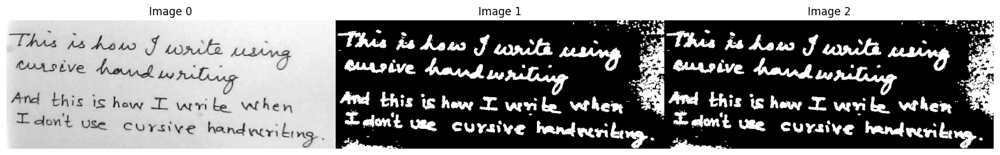

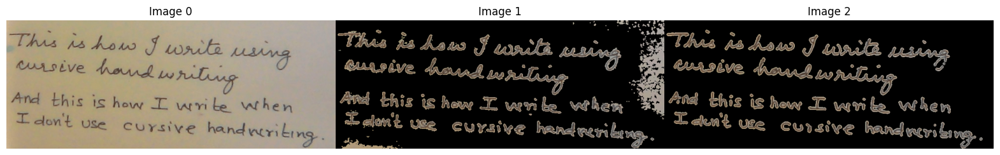

In [68]:
ShowImage([image, binary_niblack, binary_niblack], 1, 3)

binary_niblack_color = SegmentColorImageByMask(image_orig, binary_niblack)
binary_sauvola_color = SegmentColorImageByMask(image_orig, binary_sauvola)

ShowImage([image_orig, binary_niblack_color, binary_sauvola_color], 1, 3)

------
## 2.1 Segment hình ảnh về da

- Trong hình ảnh, đối tượng cần segment là vùng da bị tổn thương (vùng sẫm màu) trong bức ảnh

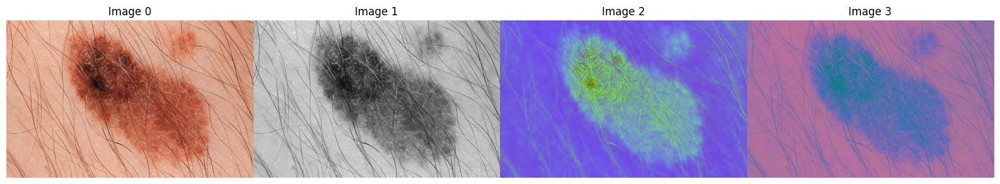

In [69]:
current_path = os.getcwd()
file_name = 'dataset/Melanoma.jpg'

image_orig = cv2.imread(os.path.join(current_path, file_name))
image_orig = cv2.cvtColor(image_orig, cv2.COLOR_RGB2BGR)
image_gray = cv2.cvtColor(image_orig, cv2.COLOR_BGR2GRAY)
image_hsv = cv2.cvtColor(image_orig, cv2.COLOR_BGR2HSV)
image_ycbcr = cv2.cvtColor(image_orig, cv2.COLOR_BGR2YCR_CB)
ShowImage([image_orig, image_gray, image_hsv, image_ycbcr], 1, 4)

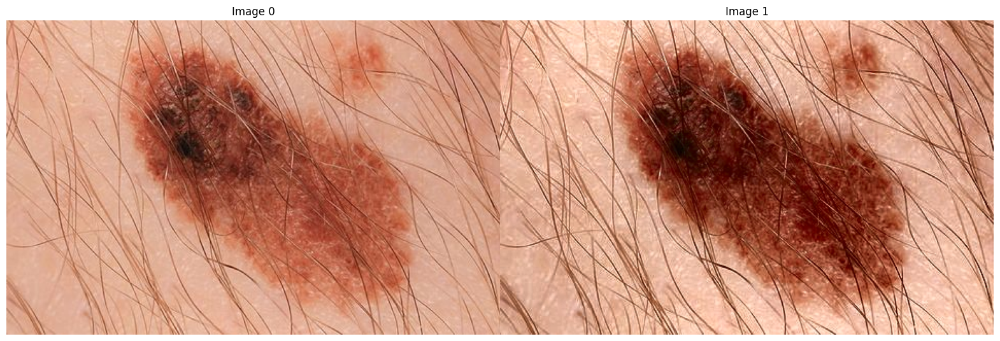

In [70]:
# converting to LAB color space
lab = cv2.cvtColor(image_orig, cv2.COLOR_RGB2LAB)
l_channel, a, b = cv2.split(lab)

# Applying CLAHE to L-channel
clahe = cv2.createCLAHE(clipLimit=1.9, tileGridSize=(2,2))
cl = clahe.apply(l_channel)

# merge the CLAHE enhanced L-channel with the a and b channel
limg = cv2.merge((cl,a,b))
# Converting image from LAB Color model to RGB color spcae
enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2RGB)
ShowImage([image_orig, enhanced_img], 1, 2)

gray_img_enhanced = cv2.cvtColor(enhanced_img, cv2.COLOR_RGB2GRAY)

- Global Thresholding bằng Multi Otsu

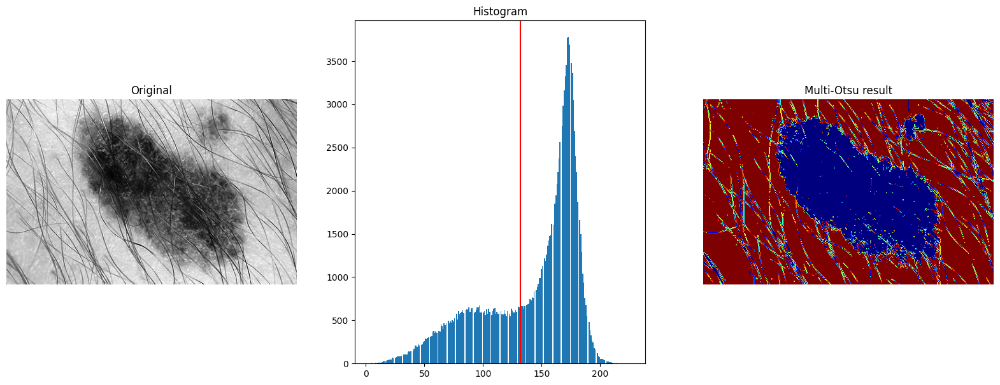

In [71]:
from skimage.filters import threshold_multiotsu
# Applying multi-Otsu threshold for the default value, generating
# three classes.
thresholds = threshold_multiotsu(gray_img_enhanced, classes=2)
# Using the threshold values, we generate the three regions.
regions = np.digitize(gray_img_enhanced, bins=thresholds)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 7))
# Plotting the original image.
ax[0].imshow(gray_img_enhanced, cmap='gray')
ax[0].set_title('Original')
ax[0].axis('off')
# Plotting the histogram and the two thresholds obtained from
# multi-Otsu.
ax[1].hist(image_gray.ravel(), bins=255)
ax[1].set_title('Histogram')
for thresh in thresholds:
    ax[1].axvline(thresh, color='r')
# Plotting the Multi Otsu result.
ax[2].imshow(regions, cmap='jet')
ax[2].set_title('Multi-Otsu result')
ax[2].axis('off')
plt.subplots_adjust()
plt.show()

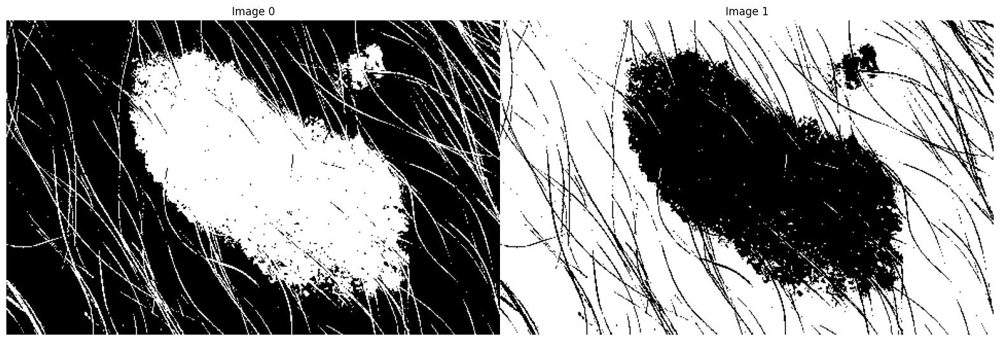

In [72]:
Segments = []
for idx in list(np.unique(regions)):
  mask = regions == idx
  Segments.append(mask)

ShowImage(Segments, 1, len(Segments))

- Local Thresholding

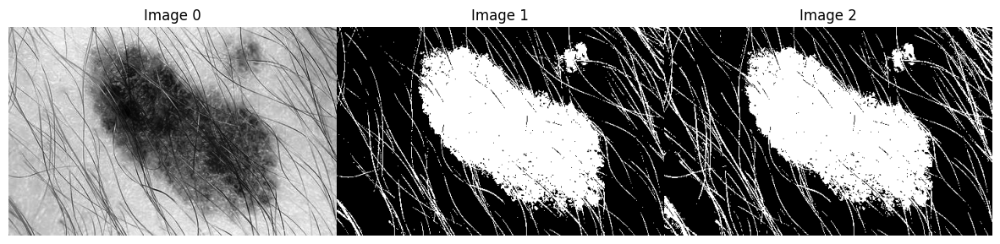

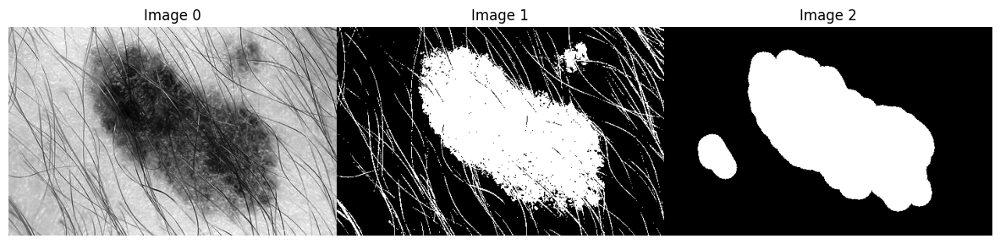

In [73]:
from skimage.filters import (threshold_otsu, threshold_niblack, threshold_sauvola)
from skimage.morphology import erosion, dilation, opening, closing, white_tophat

image = gray_img_enhanced
binary_global = image < threshold_otsu(image)

thresh_niblack = threshold_niblack(image, window_size=333)

binary_niblack = image < thresh_niblack

ShowImage([image, binary_global, binary_niblack], 1, 4)

binary_niblack = FillHoles(binary_niblack)

selem = disk(17)
binary_niblack = opening(binary_niblack, selem)

ShowImage([image, binary_global, binary_niblack], 1, 4)

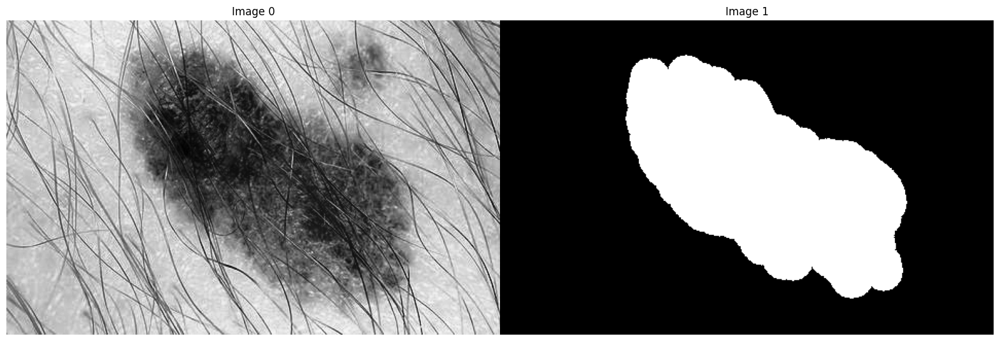

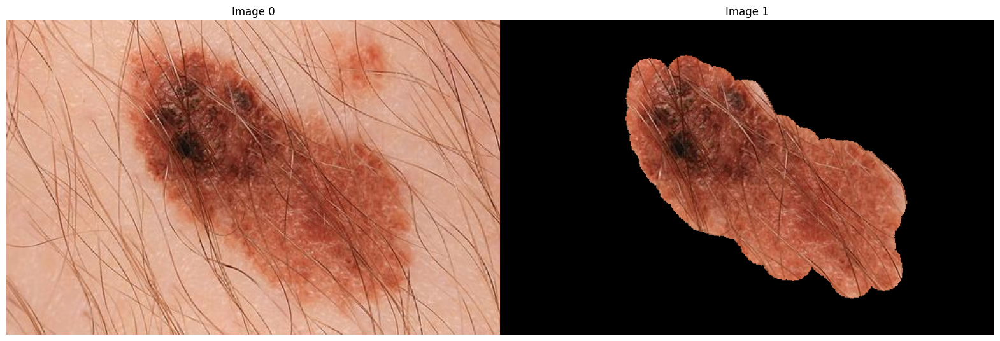

In [74]:
binary_niblack_segmentation = SelectLargestRegion(binary_niblack)

ShowImage([image, binary_niblack_segmentation], 1, 2)

binary_niblack_color = SegmentColorImageByMask(image_orig, binary_niblack_segmentation)

ShowImage([image_orig, binary_niblack_color], 1, 2)